# Importing Libraries

In [1]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
from scipy.io import wavfile as wav
import pandas as pd
import os
import numpy as np
import seaborn as sns


from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier, XGBRFClassifier
import catboost as cb
from lightgbm import LGBMClassifier

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing

import tensorflow.keras as keras
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint,LearningRateScheduler
from tensorflow.keras import Sequential
from tensorflow.keras.layers import *

# Loading and Preprocessing Data

In [2]:
path = '../input/gtzan-dataset-music-genre-classification/Data'
print(list(os.listdir(path+'/genres_original/')))

['disco', 'metal', 'reggae', 'blues', 'rock', 'classical', 'jazz', 'hiphop', 'country', 'pop']


**Function to plot audio samples along with their length and sample-rate**

In [3]:
def plot_audio(path):
    plt.figure(figsize=(12, 5))
    x, sr = librosa.load(path)
    print("length {}, sample-rate {}\n\n".format(x.shape, sr))
    librosa.display.waveshow(x, sr=sr)

**AUDIO VISUALISATION**

length (661794,), sample-rate 22050




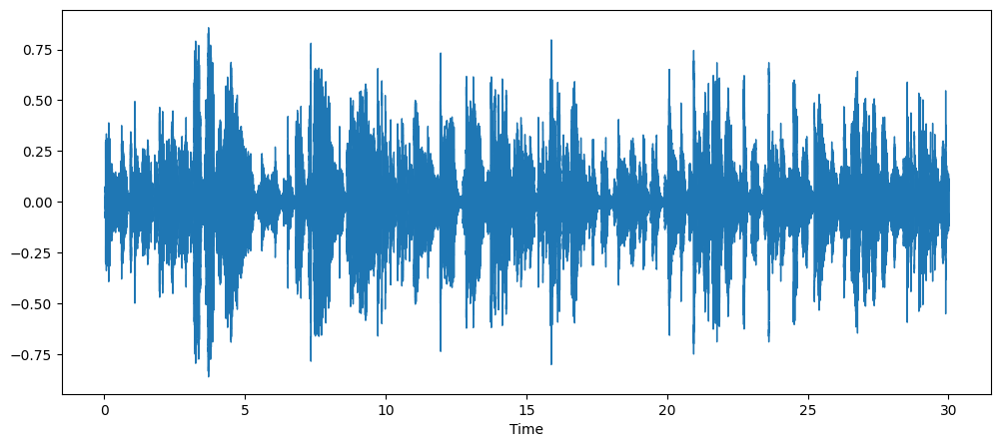

In [4]:
blues_path = path+'/genres_original/blues/blues.00004.wav'
plot_audio(blues_path)
ipd.Audio(blues_path)

length (661794,), sample-rate 22050




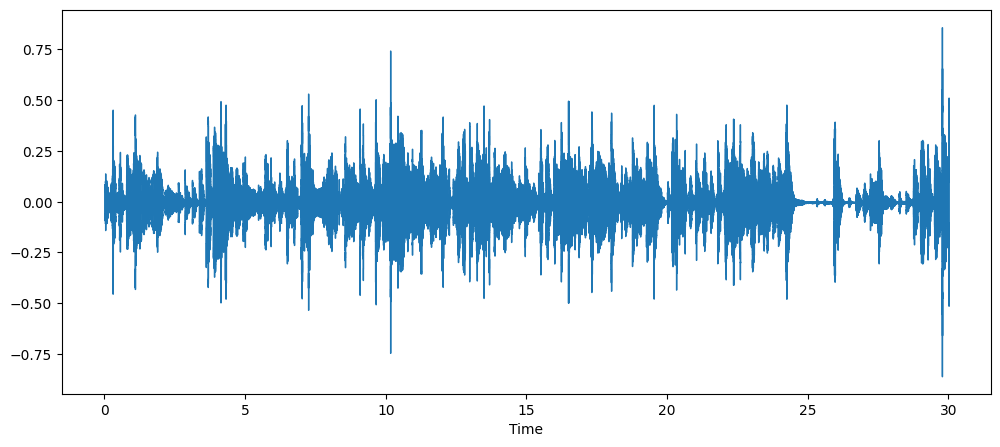

In [5]:
rock_path = path+'/genres_original/rock/rock.00014.wav'
plot_audio(rock_path)
ipd.Audio(rock_path)

length (661504,), sample-rate 22050




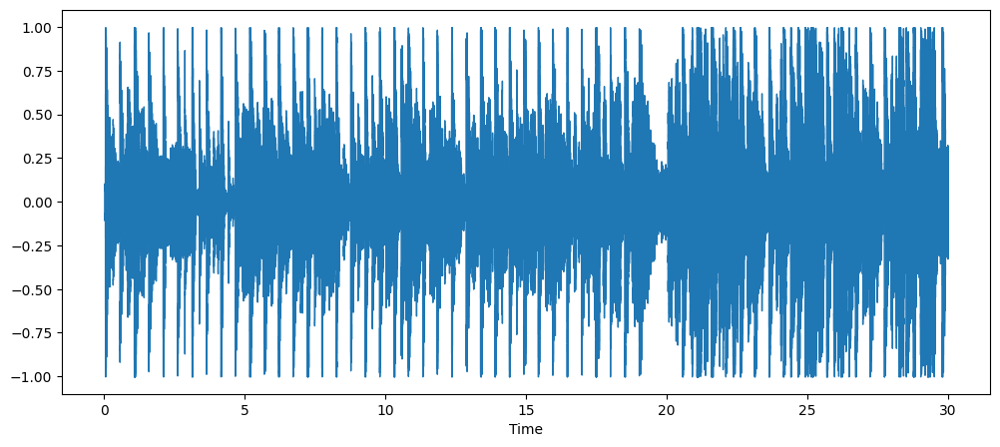

In [6]:
pop_path = path+'/genres_original/pop/pop.00024.wav'
plot_audio(pop_path)
ipd.Audio(pop_path)

In [7]:
x, sr = librosa.load(pop_path) #taking a sample path for audio visualisation

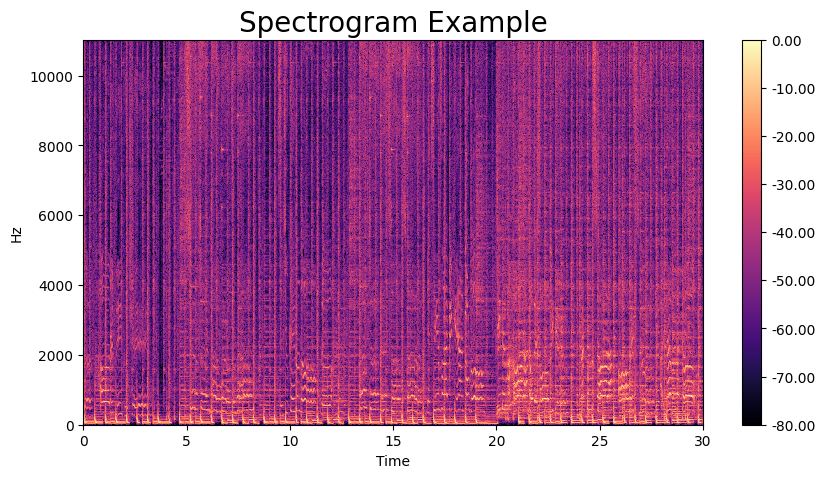

In [8]:
# Spectrogram
X = librosa.stft(x)
X_db = librosa.amplitude_to_db(abs(X),ref=np.max)
X_db.shape
fig,ax=plt.subplots(figsize=(10,5))
img=librosa.display.specshow(X_db, ax=ax, x_axis='time', y_axis='hz')
ax.set_title('Spectrogram Example',fontsize=20)
fig.colorbar(img,ax=ax,format=f'%0.2f')
plt.show()

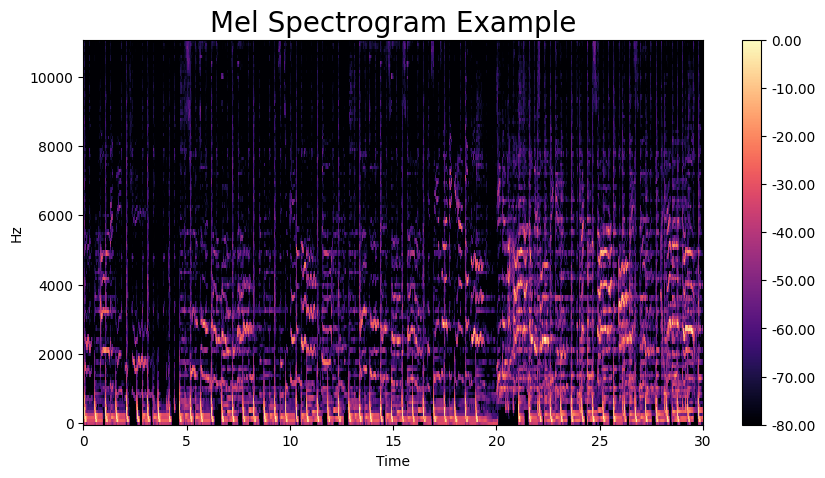

In [9]:
# Mel Spectrogram
X2=librosa.feature.melspectrogram(y=x,sr=sr,n_mels=128)
X2_db_mel=librosa.amplitude_to_db(X2,ref=np.max)
fig,ax=plt.subplots(figsize=(10,5))
img=librosa.display.specshow(X2_db_mel,ax=ax,x_axis='time',y_axis='hz')
ax.set_title('Mel Spectrogram Example',fontsize=20)
fig.colorbar(img,ax=ax,format=f'%0.2f')
plt.show()

[Text(0.5, 1.0, 'Log Power spectrogram')]

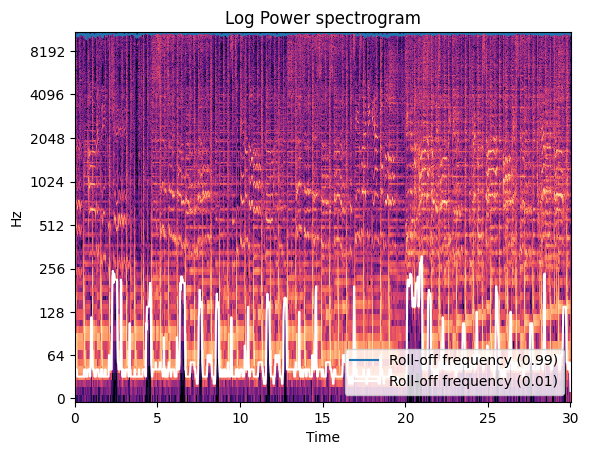

In [10]:
rolloff_max = librosa.feature.spectral_rolloff(y=x, sr=sr, roll_percent=0.99)
rolloff_min = librosa.feature.spectral_rolloff(y=x, sr=sr, roll_percent=0.01)
S, phase = librosa.magphase(librosa.stft(x))
fig, ax = plt.subplots()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax)
ax.plot(librosa.times_like(rolloff_max), rolloff_max[0], label='Roll-off frequency (0.99)')
ax.plot(librosa.times_like(rolloff_min), rolloff_min[0], color='w',
        label='Roll-off frequency (0.01)')
ax.legend(loc='lower right')
ax.set(title='Log Power spectrogram')

The number of zero crossings is: 2


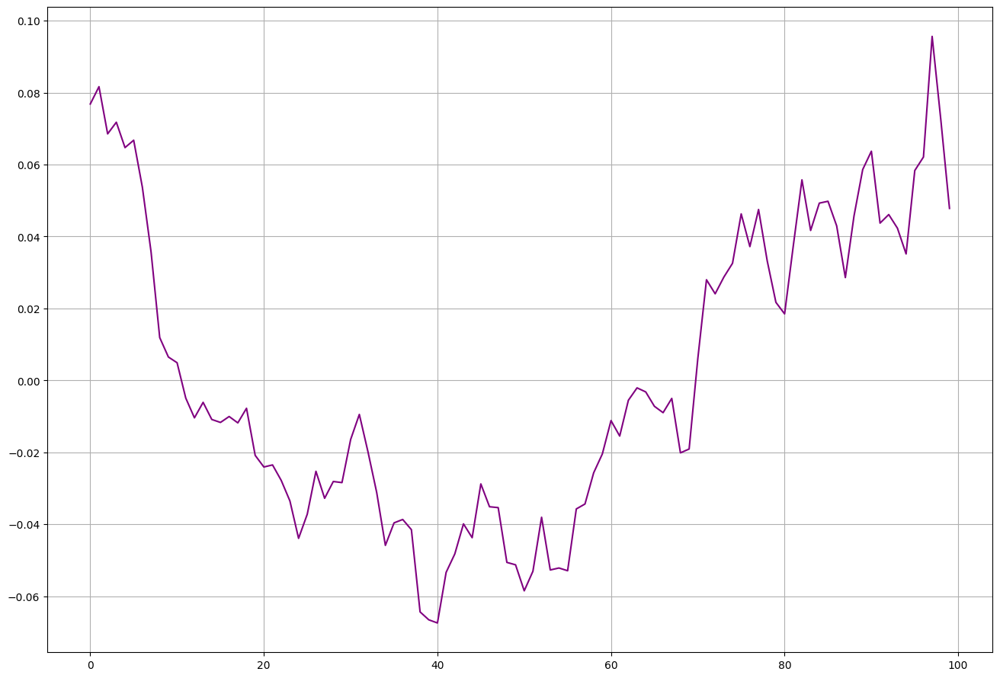

In [11]:
# The rate at which zero-crossings occur is a simple measure of the frequency content of a signal.
# Zero crossing is said to occur if successive samples have different algebric signs.
start = 300
end = 400
zero_cross_rate = librosa.zero_crossings(x[start:end], pad=False)
print("The number of zero crossings is:",sum(zero_cross_rate))
plt.figure(figsize=(16,11))
plt.plot(x[start:end], color='Purple')
plt.grid()

# Extracting and Analysing the Features

In [12]:
df = pd.read_csv('/kaggle/input/gtzan-dataset-music-genre-classification/Data/features_3_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [13]:
df.shape

(9990, 60)

In [14]:
df['label'].value_counts()

label
blues        1000
jazz         1000
metal        1000
pop          1000
reggae       1000
disco         999
classical     998
hiphop        998
rock          998
country       997
Name: count, dtype: int64

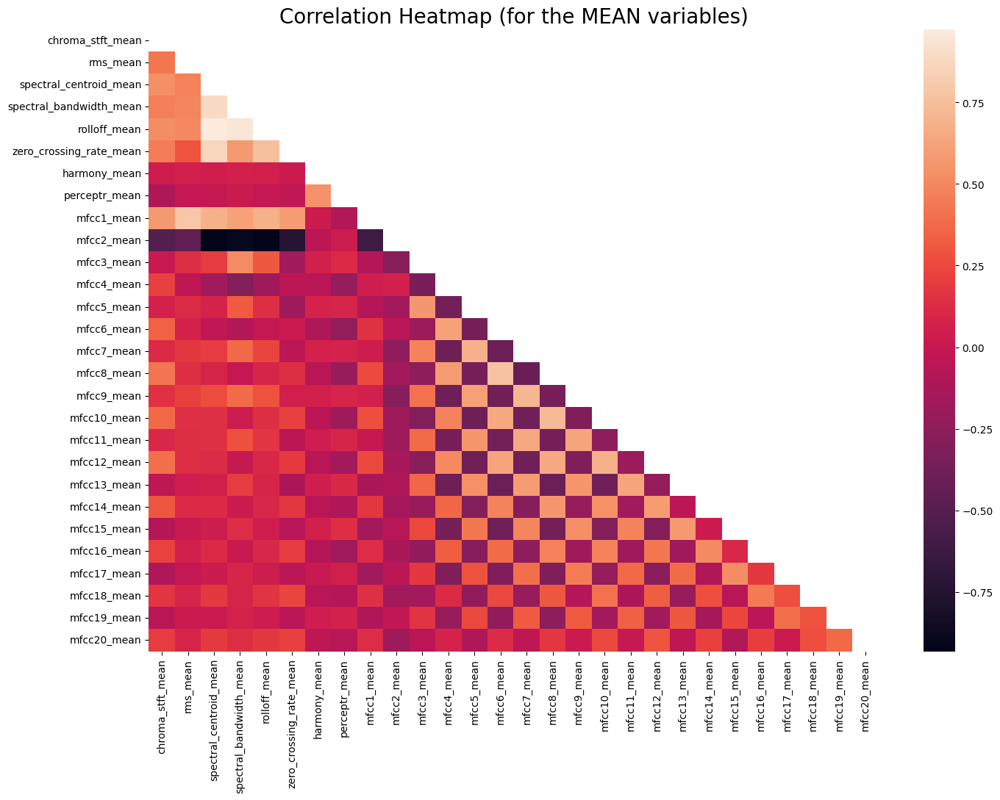

In [15]:
colus = [col for col in df.columns if 'mean' in col]
corr = df[colus].corr()

mask = np.triu(np.ones_like(corr, dtype=bool)) # Custom upper triangular mask

fif, ax = plt.subplots(figsize=(16, 11));

sns.heatmap(corr,mask=mask) # Drawing heatmap

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

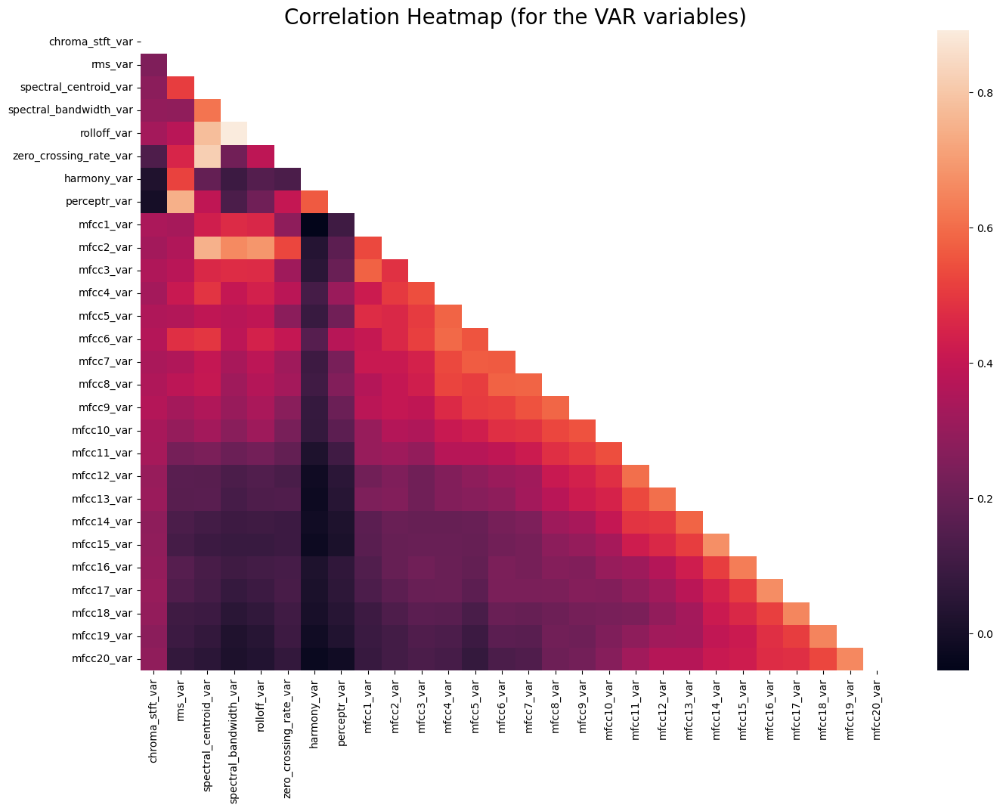

In [16]:
colums = [col for col in df.columns if 'var' in col]
corr = df[colums].corr()

mask = np.triu(np.ones_like(corr, dtype=bool))  # Custom upper triangular mask

fig, ax = plt.subplots(figsize=(16, 11));

sns.heatmap(corr,mask=mask)

plt.title('Correlation Heatmap (for the VAR variables)', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

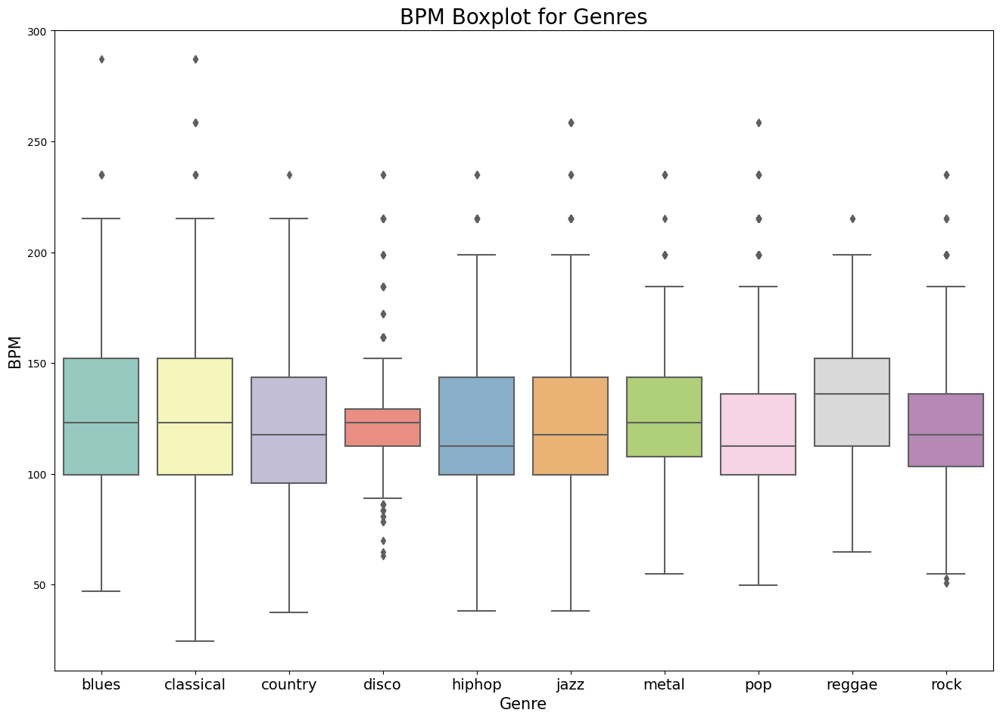

In [17]:
x = df[["label", "tempo"]]

fig, ax = plt.subplots(figsize=(16, 11));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'Set3');

plt.title('BPM Boxplot for Genres', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM_Boxplot.png")

**SCALING THE DATA**

In [18]:
df['label'] = preprocessing.LabelEncoder().fit_transform(df['label'])
X = df.drop(['label','filename'],axis=1)
y = df['label'] 
np_scaled = preprocessing.MinMaxScaler().fit_transform(X) 
X = pd.DataFrame(np_scaled, columns = X.columns)

# Train-Test Split of Data

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=24)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6993, 58), (2997, 58), (6993,), (2997,))

In [20]:
def model_assess(model, title = "Default"): # Function to fit and predict using given model
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    print('Accuracy of ', title, ':', round(accuracy_score(y_test, preds), 6), '\n')

In [21]:
# Naive Bayes
nb = GaussianNB()
model_assess(nb, "Naive Bayes")

# Stochastic Gradient Descent
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_assess(sgd, "Stochastic Gradient Descent")

# KNN
knn = KNeighborsClassifier(n_neighbors=19)
model_assess(knn, "KNN")

# Decission trees
tree = DecisionTreeClassifier()
model_assess(tree, "Decission trees")

# Random Forest
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_assess(rforest, "Random Forest")

# Support Vector Machine
svm = SVC(decision_function_shape="ovo")
model_assess(svm, "Support Vector Machine")

# Logistic Regression
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial',max_iter=1000)
model_assess(lg, "Logistic Regression")

# Catboost
cbc = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
model_assess(cbc,"Cat Boost Classifier")

# Cross Gradient Booster
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_assess(xgb, "Cross Gradient Booster")

# Cross Gradient Booster (Random Forest)
xgbrf = XGBRFClassifier(objective= 'multi:softmax')
model_assess(xgbrf, "Cross Gradient Booster (Random Forest)")

# LightGBM Classifier
lg = LGBMClassifier()
model_assess(lg,"Light GBM Classifier")

Accuracy of  Naive Bayes : 0.508509 

Accuracy of  Stochastic Gradient Descent : 0.651318 

Accuracy of  KNN : 0.802803 

Accuracy of  Decission trees : 0.630631 

Accuracy of  Random Forest : 0.798131 

Accuracy of  Support Vector Machine : 0.735402 

Accuracy of  Logistic Regression : 0.668001 

Accuracy of  Cat Boost Classifier : 0.899233 

Accuracy of  Cross Gradient Booster : 0.896563 

Accuracy of  Cross Gradient Booster (Random Forest) : 0.725392 

Accuracy of  Light GBM Classifier : 0.897231 



Accuracy : 0.8992325658992326


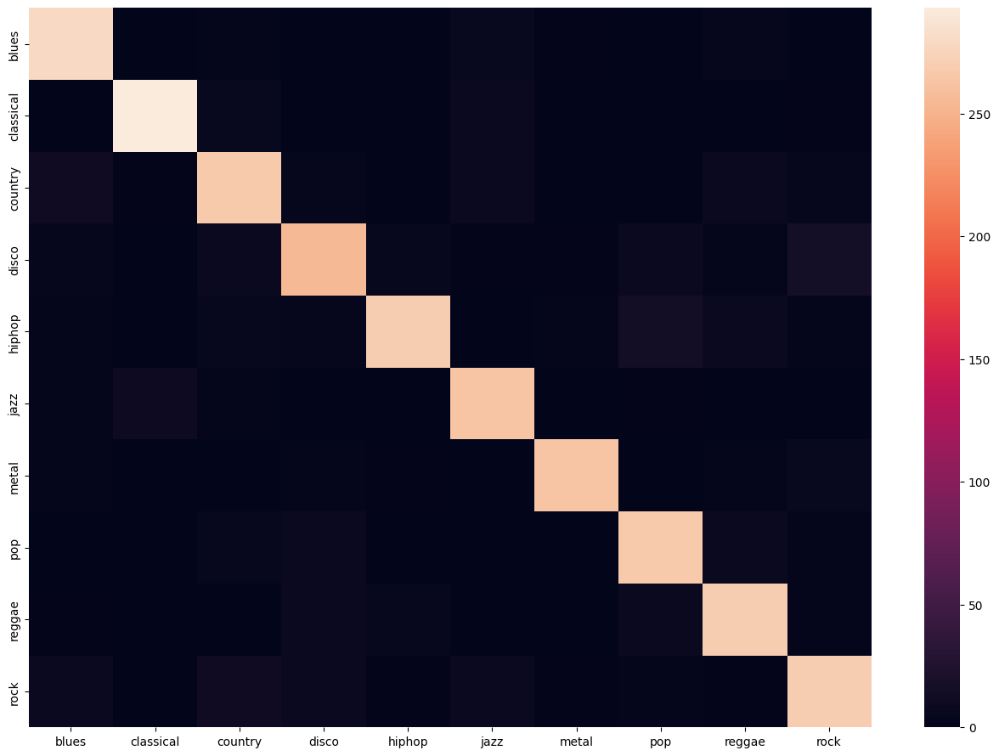

In [22]:
# As Cat Boost has the highest accuracy, we are printing its Confusion Matrix
cbm = cb.CatBoostClassifier(verbose=0, eval_metric='Accuracy', loss_function='MultiClass')
cbm.fit(X_train, y_train)

preds = cbm.predict(X_test)

print('Accuracy', ':', accuracy_score(y_test, preds))

# Confusion Matrix
confusion_mat = confusion_matrix(y_test, preds) 
plt.figure(figsize = (16, 11))
sns.heatmap(confusion_mat, 
            xticklabels = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
           yticklabels=["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]);

# Convolutional Neural Network(CNN)

In [23]:
X_train.shape[1] # To analyse the shape of the input

58

In [24]:
# All hidden layers are using ReLU activation function
# The final layer is using softmax activation function
model = keras.models.Sequential([
    Dense(512, activation='relu',input_shape=(X_train.shape[1],)),
    Dropout(0.3),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(10, activation='softmax'),])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [25]:
# Adam optimizer is used for training the neural network 
# Loss is calculated using sparse categorical cross entropy
model.compile(optimizer='adam',
             loss="sparse_categorical_crossentropy",
             metrics=["accuracy"])

In [26]:
result = model.fit(X_train, y_train,
                 validation_data = (X_test,y_test),
                 epochs = 700,
                 batch_size = 128,)

Epoch 1/700
55/55 [==============================] - 3s 17ms/step - loss: 2.1892 - accuracy: 0.1855 - val_loss: 1.9056 - val_accuracy: 0.3290
Epoch 2/700
55/55 [==============================] - 1s 13ms/step - loss: 1.7529 - accuracy: 0.3446 - val_loss: 1.4955 - val_accuracy: 0.4157
Epoch 3/700
55/55 [==============================] - 1s 12ms/step - loss: 1.5388 - accuracy: 0.4194 - val_loss: 1.3427 - val_accuracy: 0.4965
Epoch 4/700
55/55 [==============================] - 1s 12ms/step - loss: 1.4280 - accuracy: 0.4683 - val_loss: 1.2911 - val_accuracy: 0.5175
Epoch 5/700
55/55 [==============================] - 1s 13ms/step - loss: 1.3480 - accuracy: 0.5014 - val_loss: 1.2125 - val_accuracy: 0.5279
Epoch 6/700
55/55 [==============================] - 1s 12ms/step - loss: 1.2654 - accuracy: 0.5350 - val_loss: 1.1319 - val_accuracy: 0.5779
Epoch 7/700
55/55 [==============================] - 1s 12ms/step - loss: 1.2404 - accuracy: 0.5471 - val_loss: 1.0840 - val_accuracy: 0.5983
Epoch 

In [27]:
test_error, test_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test accuracy: ",test_accuracy*100)

94/94 [==============================] - 0s 2ms/step - loss: 0.3964 - accuracy: 0.9126
Test accuracy:  91.25792384147644


In [28]:
print("Validation Accuracy: ",100*max(result.history["val_accuracy"]))

Validation Accuracy:  92.09209084510803


<Figure size 2000x1500 with 0 Axes>

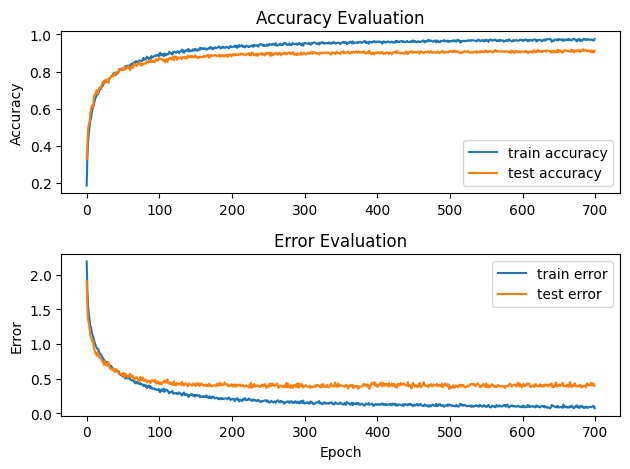

In [29]:
plt.figure(figsize=(20,15))
fig, axs = plt.subplots(2)

# Accuracy 
axs[0].plot(result.history["accuracy"], label="train accuracy")
axs[0].plot(result.history["val_accuracy"], label="test accuracy")    
axs[0].set_ylabel("Accuracy")
axs[0].legend(loc="lower right")
axs[0].set_title("Accuracy Evaluation")

# Error 
axs[1].plot(result.history["loss"], label="train error")
axs[1].plot(result.history["val_loss"], label="test error")    
axs[1].set_ylabel("Error")
axs[1].set_xlabel("Epoch")
axs[1].legend(loc="upper right")
axs[1].set_title("Error Evaluation")

fig.tight_layout()
    
plt.show()

**THUS WE WERE SUCCESSFUL IN CREATING A NEURAL NETWORK THAT IS ABLE TO CLASSIFY THE GENRE OF A PARTICULAR AUDIO TRACK**

# Identifying Similar Audio using Cosine Similarity

In [30]:
df = pd.read_csv(path+'/features_30_sec.csv', index_col='filename')

labels = df[['label']]

df = df.drop(columns=['length','label'])

scaled=preprocessing.scale(df)

In [31]:
sim = cosine_similarity(scaled)
print("Shape of similarity:", sim.shape)

sim_df = pd.DataFrame(sim)
sim_df_labels = sim_df.set_index(labels.index)
sim_df_labels.columns = labels.index

sim_df_labels

Shape of similarity: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rock.00095.wav,0.610942,-0.077301,0.495707,-0.000287,0.063454,-0.231012,-0.251086,-0.180628,0.619450,-0.258421,...,0.023926,0.843727,0.851726,0.860594,0.851456,1.000000,0.902064,0.865241,0.349870,0.522483
rock.00096.wav,0.640835,-0.222119,0.566837,0.020515,0.063546,-0.272209,-0.291506,-0.256171,0.612170,-0.304636,...,-0.033826,0.871226,0.882825,0.880362,0.863062,0.902064,1.000000,0.902071,0.337834,0.472331
rock.00097.wav,0.496294,-0.302573,0.589983,-0.107821,0.172944,-0.175960,-0.203014,-0.155732,0.461320,-0.330066,...,-0.008336,0.914170,0.926558,0.897654,0.878851,0.865241,0.902071,1.000000,0.287157,0.415173


In [32]:
# Function to find similar audio tracks  
def similar_tracks(audiotrack): 
    series = sim_df_labels[audiotrack].sort_values(ascending = False)
    print("Similar songs to ", audiotrack)
    series = series.drop(audiotrack)
    print(series.head(10)) # Printing the first 10 audio that matches with given audio track

In [33]:
similar_tracks('rock.00011.wav') 
ipd.Audio(path+'/genres_original/pop/pop.00044.wav')

Similar songs to  rock.00011.wav
filename
country.00054.wav    0.600560
jazz.00095.wav       0.593636
jazz.00027.wav       0.554560
jazz.00038.wav       0.544000
jazz.00015.wav       0.530824
disco.00056.wav      0.522754
jazz.00008.wav       0.522250
blues.00008.wav      0.519551
rock.00099.wav       0.504950
rock.00013.wav       0.494389
Name: rock.00011.wav, dtype: float64


In [34]:
ipd.Audio(path+'/genres_original/country/country.00054.wav')

In [35]:
ipd.Audio(path+'/genres_original/jazz/jazz.00095.wav')